NOTE (September 2025): I had to create a new environment for this script - 'spwxr_netCDF' (previously used 'spwxr_network')



In [111]:
import numpy as np
import pandas as pd
import os, sys
import glob


from datetime import datetime, time

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter


import geopandas as gpd
from shapely.geometry import Point

import xarray as xr

import supermag_api


import plotly.express as px
import plotly.graph_objs as go

from scipy.integrate import trapz

from scipy.stats import genextreme, genpareto
from pyextremes import get_return_periods




In [112]:
# custom functions


def build_datetime_vec(y, mo, d, h, mi, s):
    y = y.astype(str)
    mo = np.char.zfill(mo.astype(str), 2)
    d = np.char.zfill(d.astype(str), 2)
    h = np.char.zfill(h.astype(str), 2)
    mi = np.char.zfill(mi.astype(str), 2)
    s = np.char.zfill(s.astype(str), 2)
    
    dt_str = np.char.add(y, '-')
    dt_str = np.char.add(dt_str, mo)
    dt_str = np.char.add(dt_str, '-')
    dt_str = np.char.add(dt_str, d)
    dt_str = np.char.add(dt_str, 'T')
    dt_str = np.char.add(dt_str, h)
    dt_str = np.char.add(dt_str, ':')
    dt_str = np.char.add(dt_str, mi)
    dt_str = np.char.add(dt_str, ':')
    dt_str = np.char.add(dt_str, s)
    
    return dt_str.astype('datetime64[ns]')





In [2]:
# Load NERC regions
regions_gdf = gpd.read_file("/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/NERC_Reliability_Coordinators.geojson")
# Ensure the CRS is WGS84 (EPSG:4326)
if regions_gdf.crs is None or regions_gdf.crs.to_string() != "EPSG:4326":
    print('converting to EPSG: 4326')
    regions_gdf = regions_gdf.to_crs("EPSG:4326")


/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/geopandas/io/file.py:364: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")
/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/geopandas/io/file.py:364: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")


In [3]:
# Read in supermag station information 
df_sm_stations = pd.read_csv('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/supermag_data/supermag-stations-information-downloadedJuly2025.csv',
                            usecols=[0,1,2,3,4,5])


df_sm_stations['GEOLON_alt'] = ((df_sm_stations['GEOLON'] + 180) % 360) - 180
gdf_sm_stations = gpd.GeoDataFrame(
                            df_sm_stations,
                            geometry=[Point(xy) for xy in zip(df_sm_stations["GEOLON_alt"], df_sm_stations["GEOLAT"])],
                            crs="EPSG:4326"
                            )

sm_stations_locations_with_regions = gpd.sjoin(gdf_sm_stations, regions_gdf, how="left", predicate="within")
sm_stations_locations_with_regions['Region'] = sm_stations_locations_with_regions['NAME']
sm_stations_locations_with_regions_US = sm_stations_locations_with_regions.dropna(subset=['Region'], inplace=False)


In [4]:
# read in the GIC sensor locations for May 2024 storm

file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data','event_20240510','GIC','gic_monitors.csv')

df_sensor_locations = pd.read_csv(file_sensor_locations)
df_sensor_locations[' Longitude'] = df_sensor_locations[' Longitude'] * -1.

# Convert sensor DataFrame to GeoDataFrame
gdf_sensor_locations = gpd.GeoDataFrame(
                            df_sensor_locations,
                            geometry=[Point(xy) for xy in zip(df_sensor_locations[" Longitude"], df_sensor_locations[" Latitude"])],
                            crs="EPSG:4326"
                            )

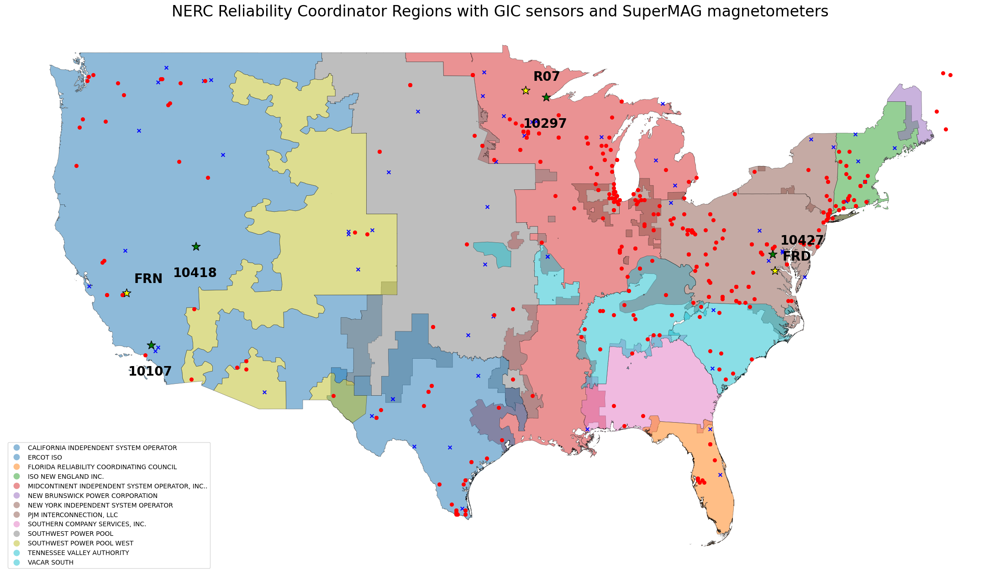

In [178]:
# Plot the data for this event
fig, ax = plt.subplots(1, 1, figsize=(22, 16))

# Select the stations of interest
highlight_stations = sm_stations_locations_with_regions_US[
    # sm_stations_locations_with_regions_US['IAGA'].isin(['R02', 'R05','R07', 'FRD', 'FRN'])
    sm_stations_locations_with_regions_US['IAGA'].isin(['R07', 'FRD', 'FRN'])
]
highlight_sensors = gdf_sensor_locations[
    gdf_sensor_locations['Device ID'].isin([10427,10418,10107,10297])
]

# Plot the NERC RC regions colored by region name or code
regions_gdf.plot(column='NAME', categorical=True, legend=True, 
        edgecolor='black', linewidth=0.5, ax=ax, alpha=0.5)

# Plot sensor locations
sm_stations_locations_with_regions_US.plot(ax=ax, marker='x',color='blue', markersize=30, label='Magnetometers')
gdf_sensor_locations.plot(ax=ax, color='red', markersize=30, label='Sensors')

# Plot highlighted stations with bigger markers
highlight_stations.plot(ax=ax, color='yellow', edgecolor='black', markersize=200, marker='*', label='Highlighted Stations')

# Add text labels so they’re clearly indicated
for x, y, label in zip(highlight_stations.geometry.x, highlight_stations.geometry.y, highlight_stations['IAGA']):
    ax.text(x + 0.5, y + 0.5, label, fontsize=20, fontweight='bold', color='black')

# Plot highlighted sensors with bigger markers
highlight_sensors.plot(ax=ax, color='green', edgecolor='black', markersize=200, marker='*', label='Highlighted Sensors')

# Add text labels so they’re clearly indicated
for x, y, label in zip(highlight_sensors.geometry.x, highlight_sensors.geometry.y, highlight_sensors['Device ID']):
    if label == 10427:
        ax.text(x + 0.5, y + 0.5, label, fontsize=20, fontweight='bold', color='black')
    else:
        ax.text(x - 1.5, y - 1.5, label, fontsize=20, fontweight='bold', color='black')

ax.set_title('NERC Reliability Coordinator Regions with GIC sensors and SuperMAG magnetometers', fontsize=24)
ax.set_axis_off()
# ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

,datetimes,10253,10521,10290,10469,10441,10455,10333,10482,10496,...,Vx,Vy,Vz,YR,flow_speed,percent_interp,proton_density,x,y,z
0,2024-05-10 00:00:00,-0.7,1.3,1.14,1.2,NaN,3.7,-2.0,-0.4,3.8,...,NaN,NaN,NaN,2024.0,NaN,100.0,NaN,NaN,NaN,NaN
1,2024-05-10 00:00:10,-0.7,NaN,1.14,NaN,-7.17,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2024-05-10 00:00:20,-0.7,NaN,1.14,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2024-05-10 00:00:30,-0.5,NaN,1.14,NaN,-7.29,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2024-05-10 00:00:40,-0.6,NaN,1.14,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34556,2024-05-13 23:59:20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34557,2024-05-13 23:59:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34558,2024-05-13 23:59:40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34559,2024-05-13 23:59:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [53]:


def compute_Hprime(mag_data):
    # requires the presence of 'dbe_nez' and 'dbn_nez' as columns and datetime as index
    dbe_dt = mag_data['dbe_nez'].diff()
    dbn_dt = mag_data['dbn_nez'].diff()
    
    # Combine
    mag_dH_dt = np.sqrt(dbe_dt**2 + dbn_dt**2)

    mag_data_out = mag_data.copy()
    mag_data_out['mag_dH_dt'] = mag_dH_dt
    
    return mag_data_out




### Explore the data

In [74]:
# Look at the Gannon Storm for all GIC sensors and SuperMAG stations

sm_selected = ['FRN','R07','FRD']
gic_selected = ['10418','10297','10427']

# sm_data_gannon = pd.read_csv('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/supermag_data/SuperMAG_60s_custom_20240510_to_20240511_rev-0006.1758552864.csv')
sm_data_gannon = pd.read_csv('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/supermag_data/SuperMAG_60s_custom_20240510_to_20240512_rev-0006.1758641261.csv')
sm_data_gannon['Date_UTC'] = pd.to_datetime(sm_data_gannon['Date_UTC'])
sm_data_gannon = sm_data_gannon.set_index('Date_UTC')
FRN_data_gannon = sm_data_gannon[sm_data_gannon['IAGA']==sm_selected[0]]
FRN_data_gannon = compute_Hprime(FRN_data_gannon)

R07_data_gannon = sm_data_gannon[sm_data_gannon['IAGA']==sm_selected[1]]
R07_data_gannon = compute_Hprime(R07_data_gannon)

FRD_data_gannon = sm_data_gannon[sm_data_gannon['IAGA']==sm_selected[2]]
FRD_data_gannon = compute_Hprime(FRD_data_gannon)

gic_data_gannon = pd.read_csv('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20240510.csv')
gic_data_gannon['datetimes'] = pd.to_datetime(gic_data_gannon['datetimes'])
gic_data_gannon = gic_data_gannon.set_index(gic_data_gannon['datetimes'])
gic_10418_data_gannon = gic_data_gannon[gic_selected[0]]
gic_10297_data_gannon = gic_data_gannon[gic_selected[1]]
gic_10427_data_gannon = gic_data_gannon[gic_selected[2]]






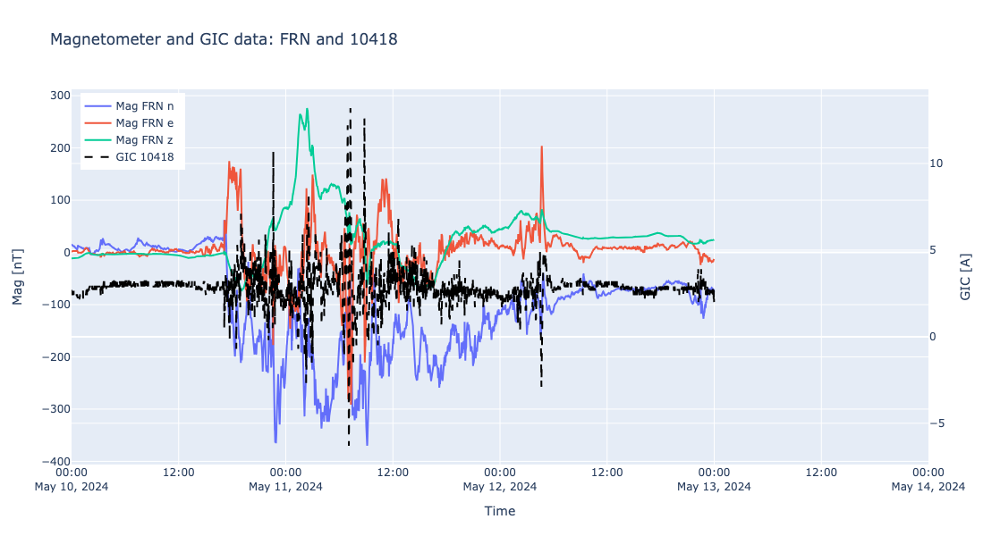

In [75]:

fig = go.Figure()

fig.add_trace(go.Scatter(
            x=FRN_data_gannon.index,
            y=FRN_data_gannon['dbn_nez'],#'dbe_nez','dbz_nez']],
            name=f'Mag {sm_selected[0]} n',
            yaxis='y1',
            mode='lines'
        ))

fig.add_trace(go.Scatter(
            x=FRN_data_gannon.index,
            y=FRN_data_gannon['dbe_nez'],#'dbz_nez']],
            name=f'Mag {sm_selected[0]} e',
            yaxis='y1',
            mode='lines'
        ))

fig.add_trace(go.Scatter(
            x=FRN_data_gannon.index,
            y=FRN_data_gannon['dbz_nez'],
            name=f'Mag {sm_selected[0]} z',
            yaxis='y1',
            mode='lines'
        ))

# # Add GIC on y-axis 2
# fig.add_trace(go.Scatter(
#     x=FRN_data_gannon.index,
#     y=FRN_data_gannon['mag_dH_dt'], 
#     name=f'|dH/dt| {sm_selected[0]}',
#     yaxis='y2',
#     mode='lines',
#     line=dict(color='blue', width=2, dash='dot')
# ))

fig.add_trace(go.Scatter(
    x=gic_10418_data_gannon.index,
    y=gic_10418_data_gannon,
    name=f'GIC {gic_selected[0]}',
    yaxis='y2',
    mode='lines',
    line=dict(color='black', width=2, dash='dash')
))

# Layout with dual axes
fig.update_layout(
    title='Magnetometer and GIC data: FRN and 10418',
    xaxis=dict(title='Time'),
    yaxis=dict(title='Mag [nT]', side='left'),
    yaxis2=dict(title='GIC [A]', overlaying='y', side='right'),
    legend=dict(x=0.01, y=0.99),
    height=600
)

fig.show()


In [ ]:
fig = go.Figure()

# fig.add_trace(go.Scatter(
#     x=gic_10418_data_gannon,
#     y=FRN_data_gannon['mag_dH_dt'], 
#     name=f'|dH/dt| vs GIC',
#     mode='markers',
# ))

time_minutes = np.arange(0, 4320)              # 4320 minutes ~ 3 days
time_seconds = np.arange(0, 34561) / 6        # same span, 10s resolution

# Create a 2D density plot of (time, value) for each dataset
fig = go.Figure()

# Dataset 1: 1-minute resolution
fig.add_trace(go.Histogram2dContour(
    x=time_minutes, 
    y=FRN_data_gannon['mag_dH_dt'],
    colorscale="Blues",
    contours=dict(showlines=False),
    showscale=False,
    name="FRN"
))

# Dataset 2: 10-second resolution
fig.add_trace(go.Histogram2dContour(
    x=time_seconds, 
    y=gic_10418_data_gannon,
    colorscale="Reds",
    contours=dict(showlines=False),
    showscale=False,
    name="10418"
))

# Optionally overlay scatter of raw points (downsample if too many)
fig.add_trace(go.Scattergl(
    x=time_minutes[::100], 
    y=FRN_data_gannon['mag_dH_dt'][::100],
    mode="markers",
    marker=dict(size=3, color="blue", opacity=0.3),
    name="FRN scatter"
))

fig.add_trace(go.Scattergl(
    x=time_seconds[::500], 
    y=gic_10418_data_gannon[::500],
    mode="markers",
    marker=dict(size=3, color="red", opacity=0.3),
    name="10418 scatter"
))

fig.update_layout(
    title="Density Comparison for FRN and 10418",
    xaxis_title="Time",
    yaxis_title="Value",
    showlegend=True
)

fig.show()


In [98]:

# Align by resampling to 1-minute resolution (average sec data)
tmp = gic_10418_data_gannon.copy()
tmp = tmp.resample("1min").mean()

# Merge on time

df_minute_FRN_10418 = pd.DataFrame(FRN_data_gannon['mag_dH_dt']).join(tmp, how="inner").dropna()



In [ ]:
fig = go.Figure()

# Density heatmap (like a KDE)
fig.add_trace(go.Histogram2dContour(
    x=df_minute_FRN_10418["mag_dH_dt"], 
    y=df_minute_FRN_10418["10418"],
    colorscale="Blues",
    contours=dict(showlines=False),
    name="Density"
))

# Raw scatter points (light, for context)
fig.add_trace(go.Scattergl(
    x=df_minute_FRN_10418["mag_dH_dt"], 
    y=df_minute_FRN_10418["10418"],
    mode="markers",
    marker=dict(size=3, color="black", opacity=0.3),
    name="Points"
))

fig.update_layout(
    title="Correlation between FRN and 10418",
    xaxis_title="mag_dH_dt",
    yaxis_title="10418",
    showlegend=True
)

fig.show()

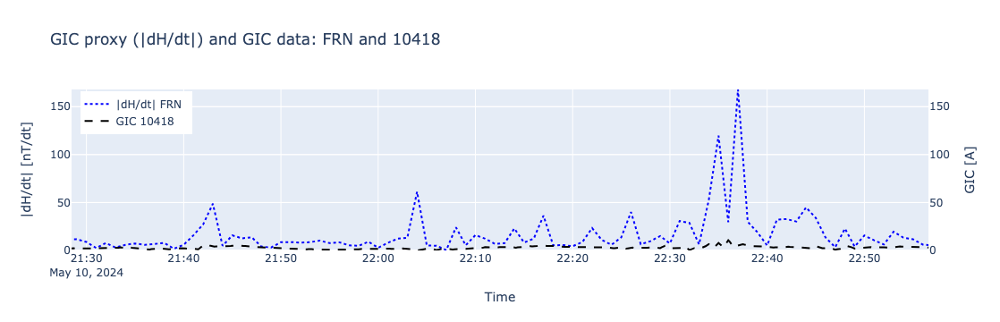

In [76]:

fig = go.Figure()

range_y1_max = FRN_data_gannon['mag_dH_dt'].max()
range_y1_min = FRN_data_gannon['mag_dH_dt'].min()
range_y2_max = gic_10418_data_gannon.max()
range_y2_min = gic_10418_data_gannon.min()

range_max = np.max([range_y1_max,range_y2_max])
range_min = np.max([range_y1_min,range_y2_min])



fig.add_trace(go.Scatter(
    x=FRN_data_gannon.index,
    y=FRN_data_gannon['mag_dH_dt'], 
    name=f'|dH/dt| {sm_selected[0]}',
    yaxis='y1',
    mode='lines',
    line=dict(color='blue', width=2, dash='dot')
))

# Add GIC on y-axis 2
fig.add_trace(go.Scatter(
    x=gic_10418_data_gannon.index,
    y=gic_10418_data_gannon,
    name=f'GIC {gic_selected[0]}',
    yaxis='y2',
    mode='lines',
    line=dict(color='black', width=2, dash='dash')
))

# Layout with dual axes
fig.update_layout(
    title='GIC proxy (|dH/dt|) and GIC data: FRN and 10418',
    xaxis=dict(title='Time'),
    yaxis=dict(title='|dH/dt| [nT/dt]', side='left', range=[range_min,range_max]),
    yaxis2=dict(title='GIC [A]', overlaying='y', side='right', range=[range_min,range_max]),
    legend=dict(x=0.01, y=0.99),
    height=600
)

fig.show()


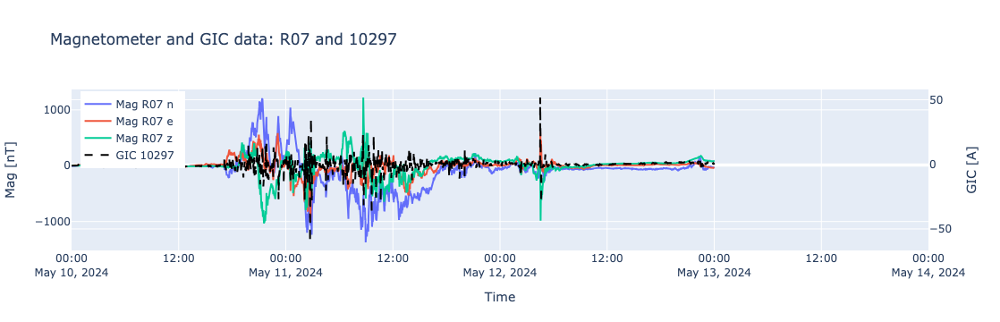

In [77]:

fig = go.Figure()

fig.add_trace(go.Scatter(
            x=R07_data_gannon.index,
            y=R07_data_gannon['dbn_nez'],#'dbe_nez','dbz_nez']],
            name=f'Mag {sm_selected[1]} n',
            yaxis='y1',
            mode='lines'
        ))

fig.add_trace(go.Scatter(
            x=R07_data_gannon.index,
            y=R07_data_gannon['dbe_nez'],#'dbz_nez']],
            name=f'Mag {sm_selected[1]} e',
            yaxis='y1',
            mode='lines'
        ))

fig.add_trace(go.Scatter(
            x=R07_data_gannon.index,
            y=R07_data_gannon['dbz_nez'],
            name=f'Mag {sm_selected[1]} z',
            yaxis='y1',
            mode='lines'
        ))


fig.add_trace(go.Scatter(
    x=gic_10297_data_gannon.index,
    y=gic_10297_data_gannon,
    name=f'GIC {gic_selected[1]}',
    yaxis='y2',
    mode='lines',
    line=dict(color='black', width=2, dash='dash')
))

# Layout with dual axes
fig.update_layout(
    title='Magnetometer and GIC data: R07 and 10297',
    xaxis=dict(title='Time'),
    yaxis=dict(title='Mag [nT]', side='left'),
    yaxis2=dict(title='GIC [A]', overlaying='y', side='right'),
    legend=dict(x=0.01, y=0.99),
    height=600
)

fig.show()


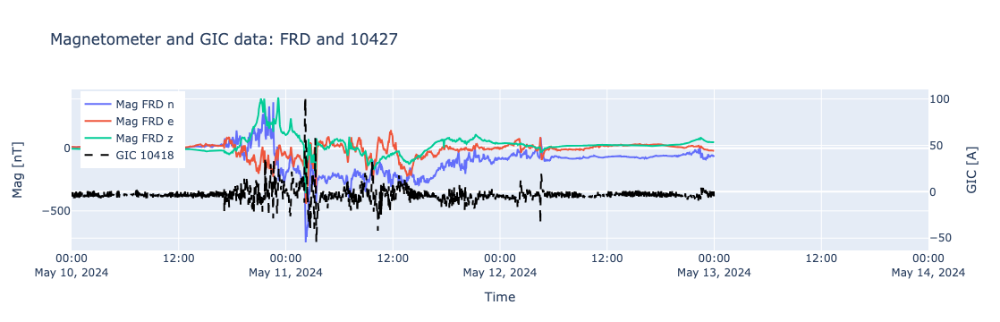

In [78]:

fig = go.Figure()

fig.add_trace(go.Scatter(
            x=FRD_data_gannon.index,
            y=FRD_data_gannon['dbn_nez'],#'dbe_nez','dbz_nez']],
            name=f'Mag {sm_selected[2]} n',
            yaxis='y1',
            mode='lines'
        ))

fig.add_trace(go.Scatter(
            x=FRD_data_gannon.index,
            y=FRD_data_gannon['dbe_nez'],#'dbz_nez']],
            name=f'Mag {sm_selected[2]} e',
            yaxis='y1',
            mode='lines'
        ))

fig.add_trace(go.Scatter(
            x=FRD_data_gannon.index,
            y=FRD_data_gannon['dbz_nez'],
            name=f'Mag {sm_selected[2]} z',
            yaxis='y1',
            mode='lines'
        ))


fig.add_trace(go.Scatter(
    x=gic_10427_data_gannon.index,
    y=gic_10427_data_gannon,
    name=f'GIC {gic_selected[0]}',
    yaxis='y2',
    mode='lines',
    line=dict(color='black', width=2, dash='dash')
))

# Layout with dual axes
fig.update_layout(
    title='Magnetometer and GIC data: FRD and 10427',
    xaxis=dict(title='Time'),
    yaxis=dict(title='Mag [nT]', side='left'),
    yaxis2=dict(title='GIC [A]', overlaying='y', side='right'),
    legend=dict(x=0.01, y=0.99),
    height=600
)

fig.show()


### Conduct PHA

In [157]:
sm_station_pha = 'FRN'
gic_station_pha = '10418'

#### read in full year of data for each SuperMAG station and perform needed calculations


In [179]:
file_sm = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/supermag_data/SuperMAG_60s_'+sm_station_pha+'_2024_rev-0006.1753287357.netcdf'
ds_sm = xr.open_dataset(file_sm, chunks={'time': 10000})
ds_sm = ds_sm.drop_vars(['extent','dbe_geo','dbn_geo','dbn_geo'])

for var in ['time_yr', 'time_mo', 'time_dy', 'time_hr', 'time_mt', 'time_sc']:
    ds_sm[var] = ds_sm[var].astype(int)



datetime_da = xr.apply_ufunc(
    build_datetime_vec,
    ds_sm['time_yr'], ds_sm['time_mo'], ds_sm['time_dy'],
    ds_sm['time_hr'], ds_sm['time_mt'], ds_sm['time_sc'],
    dask='allowed',
    output_dtypes=[np.dtype('datetime64[ns]')]
)


   # Assign as time coordinate
ds_sm = ds_sm.assign_coords(time=datetime_da)
ds_sm['time'] = pd.to_datetime(ds_sm['time'].values)
# H = np.sqrt(ds_FRD['dbe_nez']**2 + ds_FRD['dbn_nez']**2)
# ds_FRD['H'] = H

# ds_FRD['H'] = ds_FRD['H'].rename({'block': 'time'})
# H_1d = ds_FRD['H'].squeeze('vector')
# dH = ds_FRD['H'].diff('time')
# dt = ds_FRD['time'].diff('time') / np.timedelta64(1, 's')
# dt = dt.astype('float64')  # ensure float for safe division
# dH_dt = dH / dt
# dH_dt = dH_dt.pad(time=(1, 0), constant_values=np.nan)  # align dimensions
# ds_FRD['dH_dt'] = dH_dt
# ds_FRD = ds_FRD.rename({'block': 'time'})       # rename coordinate to match

dbe_dt = ds_sm['dbe_nez'].diff('time')
dbn_dt = ds_sm['dbn_nez'].diff('time')

# Combine
mag_dH_dt = np.sqrt(dbe_dt**2 + dbn_dt**2)

# Pad to match original time length
mag_dH_dt = mag_dH_dt.pad(time=(1, 0), constant_values=np.nan)

# Rebuild DataArray with proper coordinates
mag_dH_dt = xr.DataArray(
    data=mag_dH_dt.data,
    dims=['time', 'vector'],
    coords={
        'time': ds_sm['time'],
        'vector': ds_sm['vector'] if 'vector' in ds_sm.coords else [0]  # dummy if missing
    },
    name='mag_db_dt'
)

# Assign to dataset
ds_sm['mag_db_dt'] = mag_dH_dt
ds_sm['mag_db_dt'] = ds_sm['mag_db_dt'].compute()

ValueError: did not find a match in any of xarray's currently installed IO backends ['h5netcdf', 'scipy', 'zarr']. Consider explicitly selecting one of the installed engines via the ``engine`` parameter, or installing additional IO dependencies, see:
https://docs.xarray.dev/en/stable/getting-started-guide/installing.html
https://docs.xarray.dev/en/stable/user-guide/io.html

#### read in and concatenate the GIC events data for the given station


In [151]:
# Load integrated data files
integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files_gic = glob.glob( os.path.join(integrated_data_directory,'*.csv') )

# Histogram initializations
    # Define the histogram bins between 0 and 100
bins = np.linspace(0, 100, num=101)  # 101 edges for 100 bins
bin_centers = (bins[:-1] + bins[1:]) / 2  # Calculate bin centers for plotting later

    # Initialize an empty dictionary to store histograms for each region
year_data = {}
sensor_location_data = {}
histogram_data = {}
extreme_value_data = {}

for f in files_gic:

    # read in the numerical data for the sensors in this event
    df_tmp = pd.read_csv(f,index_col=False)
    if 'Unnamed: 0' in df_tmp.columns:
        df_tmp = df_tmp.drop(columns='Unnamed: 0')

    # read in the lat-long values for the sensors in this event
    print('\n\n\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
    print('\t--->{}'.format(f))
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')

    print('\t--->{}'.format(file_sensor_locations))
    df_sensor_locations_tmp = pd.read_csv(file_sensor_locations)
    df_sensor_locations_tmp[' Longitude'] = df_sensor_locations_tmp[' Longitude'] * -1.
    
    # Drop unwanted columns
    cols_to_drop_loc = df_tmp.columns.get_loc('AE_INDEX')
    df_tmp = df_tmp.drop(df_tmp.columns.to_list()[cols_to_drop_loc:],axis = 1)

    # get datetimes as index
    df_tmp['datetimes'] = pd.to_datetime(df_tmp['datetimes'].values)
    df_tmp = df_tmp.set_index('datetimes')

    #map to string columns
    df_tmp.columns = df_tmp.columns.map(str)
    

    # Initialize histogram for this region if not already present
    if gic_station_pha not in histogram_data:
        year_data[gic_station_pha] = []
        histogram_data[gic_station_pha] = np.zeros(len(bins) - 1)
        extreme_value_data[gic_station_pha] = []#np.array(())

    year_data[gic_station_pha].append(df_tmp.index[0].year)
    try:
        device_data = df_tmp[gic_station_pha]
    except:
        print('missing device ID = {}, continuing...'.format(gic_station_pha))
        continue


    counts, _ = np.histogram(device_data.values, bins=bins)
    max_val_device = np.nanmax( abs(device_data.values) )
    
    # Add these counts to the region's histogram
    histogram_data[gic_station_pha] += counts
    extreme_value_data[gic_station_pha].append(max_val_device)





----------------------------
working on event: event_20150919
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150919.csv
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/risk-resiliency-spwx/data/event_20150919/GIC/gic_monitors.csv
missing device ID = 10418, continuing...




----------------------------
working on event: event_20150317
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150317.csv
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/risk-resiliency-spwx/data/event_20150317/GIC/gic_monitors.csv
missing device ID = 10418, continuing...




----------------------------
working on event: event_20151220
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20151220.csv
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/risk-resiliency-spwx/da

In [ ]:
fig = go.Figure()
for col in available:
    fig.add_trace(go.Scatter(
        x=df_tmp.index,
        y=df_tmp[col],
        mode="markers+lines",
        name=col
    ))

fig.show()

In [160]:
stations_to_check = [10448, 10449, 10446, 10447, 10103, 10358, 10107, 10586, 10664,10418]
stations_to_check_str = [str(val) for val in stations_to_check]


In [ ]:
for f in files_gic[4:]:

    # read in the numerical data for the sensors in this event
    df_tmp = pd.read_csv(f,index_col=False)
    if 'Unnamed: 0' in df_tmp.columns:
        df_tmp = df_tmp.drop(columns='Unnamed: 0')

    # read in the lat-long values for the sensors in this event
    print('\n\n\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
    print('\t--->{}'.format(f))
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')

    print('\t--->{}'.format(file_sensor_locations))
    df_sensor_locations_tmp = pd.read_csv(file_sensor_locations)
    df_sensor_locations_tmp[' Longitude'] = df_sensor_locations_tmp[' Longitude'] * -1.
    
    # Drop unwanted columns
    cols_to_drop_loc = df_tmp.columns.get_loc('AE_INDEX')
    df_tmp = df_tmp.drop(df_tmp.columns.to_list()[cols_to_drop_loc:],axis = 1)

    # get datetimes as index
    df_tmp['datetimes'] = pd.to_datetime(df_tmp['datetimes'].values)
    df_tmp = df_tmp.set_index('datetimes')

    #map to string columns
    df_tmp.columns = df_tmp.columns.map(str)

    available = [c for c in stations_to_check_str if c in df_tmp.columns]
    
    if not available:
        print("None of the requested columns exist in the DataFrame.")
        continue
    

    fig = go.Figure()
    for col in available:
        fig.add_trace(go.Scatter(
            x=df_tmp.index,
            y=df_tmp[col],
            mode="markers+lines",
            name=col
        ))
    
    fig.show()
    
    input('press enter to continue...')

#### describe the statistics of each


#### calculate the return levels 


In [107]:
block_max_magdbdt = ds_FRD['mag_db_dt'].resample(time='D').max()
# Drop NaNs
block_magdbdt = block_max_magdbdt.values
block_magdbdt = block_magdbdt[np.isfinite(block_magdbdt)]
# Fit GEV
shape_magdbdt, loc_magdbdt, scale_magdbdt = genextreme.fit(block_magdbdt)


#### plot in a way that furnishes comparisons









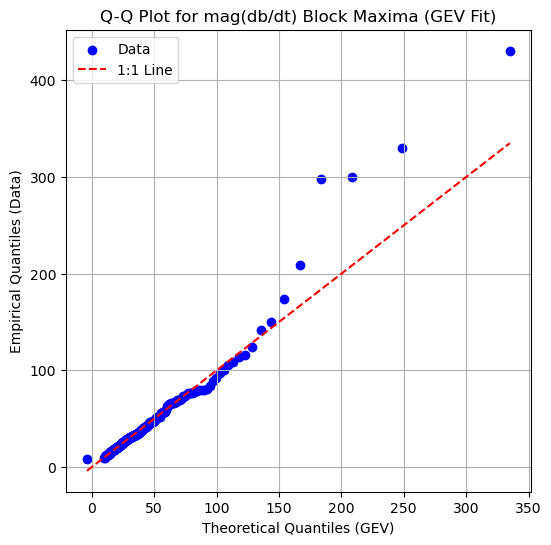

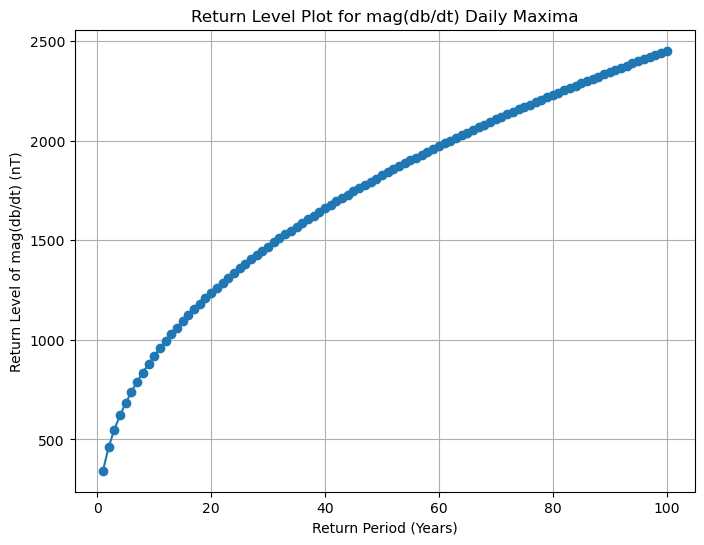

In [109]:

# Compute theoretical quantiles
percs = np.linspace(0, 100, len(block_magdbdt))
q_empirical = np.percentile(block_magdbdt, percs)
q_theoretical = genextreme.ppf(percs / 100, shape_magdbdt, loc=loc_magdbdt, scale=scale_magdbdt)

# Plot
plt.figure(figsize=(6, 6))
plt.scatter(q_theoretical, q_empirical, c='blue', label='Data')
plt.plot(q_theoretical, q_theoretical, 'r--', label='1:1 Line')
plt.xlabel('Theoretical Quantiles (GEV)')
plt.ylabel('Empirical Quantiles (Data)')
plt.title('Q-Q Plot for mag(db/dt) Block Maxima (GEV Fit)')
plt.legend()
plt.grid(True)
plt.show()



# Return Level Plot
return_periods = np.linspace(1, 100, 100)
p = 1 - 1 / (return_periods * 365.25)
return_levels_magdbdt = genextreme.ppf(p, shape_magdbdt, loc=loc_magdbdt, scale=scale_magdbdt)

plt.figure(figsize=(8, 6))
plt.plot(return_periods, return_levels_magdbdt, marker='o')
plt.xlabel('Return Period (Years)')
plt.ylabel('Return Level of mag(db/dt) (nT)')
plt.title('Return Level Plot for mag(db/dt) Daily Maxima')
plt.grid(True)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme
from scipy.optimize import minimize
import numdifftools as nd

def plot_return_levels(
    data,
    years,
    return_periods=None,
    method="bootstrap",
    nboot=500,
    event_based=False,
    bayesian_samples=None,
    plot=True
):
    """
    Compute and plot return levels with uncertainty for a dataset.

    Parameters
    ----------
    data : array-like
        Observed extremes (daily maxima for continuous data, event maxima otherwise)
    years : array-like
        Years covered by the data (only applicable for event-based maxima)
    return_periods : array-like
        Return periods (in years) to plot
    method : str
        Method for uncertainty: 'delta', 'bootstrap', 'bayesian'
    nboot : int
        Number of bootstrap iterations (if method='bootstrap')
    event_based : bool
        If True, only consider observed period (no extrapolation)
    bayesian_samples : array-like, optional
        Posterior samples for Bayesian credible intervals
    plot : bool
        Whether to produce the plot

    Returns
    -------
    rl : array
        Return level estimates
    ci_lower, ci_upper : arrays
        95% confidence intervals for return levels
    """

    data = np.asarray(data)
    if return_periods is None:
        return_periods = np.array([2,5,10,20,50,100])

    # Fit GEV via MLE
    def negloglik(params):
        c, loc, scale = params
        return -np.sum(genextreme.logpdf(data, c, loc=loc, scale=scale))

    res = minimize(negloglik, x0=[0.1, np.mean(data), np.std(data)])
    c, loc, scale = res.x
    rl_prob = 1 - 1/return_periods

    rl = genextreme.ppf(rl_prob, c, loc=loc, scale=scale)

    if method == "delta":
        # Delta method for uncertainty
        hessian = nd.Hessian(negloglik)([c, loc, scale])
        cov = np.linalg.inv(hessian)
        def qfun(params):
            return genextreme.ppf(rl_prob, *params)
        J = nd.Jacobian(qfun)([c, loc, scale])
        var_rl = np.diag(J @ cov @ J.T)
        se_rl = np.sqrt(var_rl)
        ci_lower = rl - 1.96*se_rl
        ci_upper = rl + 1.96*se_rl

    elif method == "bootstrap":
        # Parametric bootstrap
        rl_boot = []
        for _ in range(nboot):
            sample = genextreme.rvs(c, loc=loc, scale=scale, size=len(data))
            c_b, loc_b, scale_b = genextreme.fit(sample)
            rl_b = genextreme.ppf(rl_prob, c_b, loc=loc_b, scale=scale_b)
            rl_boot.append(rl_b)
        rl_boot = np.array(rl_boot)
        ci_lower = np.percentile(rl_boot, 2.5, axis=0)
        ci_upper = np.percentile(rl_boot, 97.5, axis=0)

    elif method == "bayesian":
        if bayesian_samples is None:
            raise ValueError("Provide posterior samples for Bayesian method")
        rl_samples = np.array([genextreme.ppf(rl_prob, *s) for s in bayesian_samples])
        ci_lower = np.percentile(rl_samples, 2.5, axis=0)
        ci_upper = np.percentile(rl_samples, 97.5, axis=0)
    else:
        raise ValueError("Method must be 'delta', 'bootstrap', or 'bayesian'")

    # Event-based adjustment: only consider return periods within observed period
    if event_based:
        max_period = years_observed # years observed (modify if data spans fractional years)
        mask = return_periods <= max_period
        rl = rl[mask]
        ci_lower = ci_lower[mask]
        ci_upper = ci_upper[mask]
        return_periods = return_periods[mask]

    if plot:
        plt.figure()
        plt.plot(return_periods, rl, "o-", label="Return level")
        plt.fill_between(return_periods, ci_lower, ci_upper, alpha=0.2, label="95% CI")
        plt.xscale("log")
        plt.xlabel("Return period (years)")
        plt.ylabel("Return level")
        plt.title("Return Level Plot")
        plt.legend()
        plt.show()

    return rl, ci_lower, ci_upper


In [ ]:


#SuperMAG
block_max_magdbdt = ds_sm['mag_db_dt'].resample(time='D').max()
return_periods_sm = [1,2,5,10,100,200,500]

#GIC
block_max_gic = extreme_value_data[gic_station_pha]
years_observed_gic = max(year_data[gic_station_pha]) - min(year_data[gic_station_pha]) + 1
return_periods_gic = np.arange(1, years_observed+1)  # cannot extrapolate beyond observed period

plot_return_levels(block_max_magdbdt, years_observed_gic, return_periods=return_periods_sm, method="bootstrap", event_based=False)
plot_return_levels(block_max_gic, years_observed_gic, return_periods=return_periods_gic, method="bootstrap", event_based=True)


